# DETR

**DETR (DEtection TRansformers)** is an end-to-end object detection model based on transformer architecture. Unlike traditional two-stage detectors, DETR directly predicts object queries and their corresponding positions in a single pass through the transformer network.

### - Key Components

1. **Transformer Encoder-Decoder Architecture:**
   - DETR utilizes a transformer-based architecture that consists of an encoder and a decoder. The encoder processes the input image, while the decoder generates object queries and their positions.

2. **Object Queries:**
   - Instead of using anchor boxes or predefined bounding boxes, DETR introduces learnable object queries. Each object query represents a potential object in the image.

3. **Positional Encoding:**
   - To provide spatial information to the transformer, positional encoding is added to the input image features, allowing the model to consider the location of objects.

4. **Multi-Head Self-Attention:**
   - The transformer encoder employs multi-head self-attention mechanisms, enabling the model to capture contextual relationships between different image regions.

5. **Classification and Box Regression Heads:**
   - The decoder outputs class probabilities for each object query and regresses bounding box coordinates, enabling simultaneous classification and localization.

6. **Hungarian Matching Algorithm:**
   - To associate predicted object queries with ground truth objects, DETR uses the Hungarian matching algorithm, optimizing the assignment of queries to targets.

### - Advantages

- **End-to-End Training:** DETR is trained in an end-to-end fashion, avoiding the need for anchor boxes or region proposal networks. This simplifies the training process and improves model efficiency.

- **Flexibility in Object Number:** DETR can handle a variable number of objects in an image, making it suitable for scenarios with a dynamic number of instances.

- **Global Context Awareness:** The transformer architecture allows DETR to capture global context information, enhancing its ability to understand relationships between objects.

<em>Summary</em> - DETR's transformer-based architecture offers a novel and efficient approach to end-to-end object detection, providing advantages in simplicity, flexibility, and global context awareness.

**Source**: more details is given in [Arxiv](https://arxiv.org/pdf/2005.12872.pdf)


# -- -- -- -- -- -- -- -- -- -- -- -- -- -- -- -- --
## Training setup

### 1. GPU memory usage
Run this code lines to check CUDA and GPU memory availabilty

In [1]:
!nvidia-smi

Wed Oct 18 21:44:12 2023       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.12             Driver Version: 535.104.12   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  NVIDIA RTX A6000               On  | 00000000:19:00.0 Off |                  Off |
| 30%   45C    P8              33W / 300W |  11274MiB / 49140MiB |      5%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [1]:
# Check CUDA compiler
!nvcc -V

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2023 NVIDIA Corporation
Built on Tue_Aug_15_22:02:13_PDT_2023
Cuda compilation tools, release 12.2, V12.2.140
Build cuda_12.2.r12.2/compiler.33191640_0


### <em>Optional</em>
If you'd like to use a base a pretrained DETR, you can uncomment the following line code

and change `load_from` variable in the config file [detr_hrplanesv2.py](./mmlab_configs/detr_hrplanesv2.py) from `None` to the path of the downloaded `.pth`

In [4]:
# !mim download mmdet --config detr_r50_8xb2-150e_coco --dest mmlab_configs

processing detr_r50_8xb2-150e_coco...
downloading ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 564.8/564.8 MiB 17.5 MB/s eta 0:00:0000:0100:02
Successfully downloaded detr_r50_8xb2-150e_coco_20221023_153551-436d03e8.pth to /home/safouane/Downloads/benchmark_aircraft/mmdetection/configs/detr/checkpoints
Successfully dumped detr_r50_8xb2-150e_coco.py to /home/safouane/Downloads/benchmark_aircraft/mmdetection/configs/detr/checkpoints


### Start training

you can start training Faster RCNN using this command line

In [ ]:
!python train.py mmlab_configs/faster-rcnn_hrplanesv2.py

### Wait until the training finishes
if the training takes too long you can use in the terminal the command:

 ```nohup python train.py mmlab_configs/faster-rcnn_hrplanesv2.py > faster-rcnn_hrplanesv2.log &```

### Inference
To run the inference, execute the following command

In [3]:
!python image_inference.py inference_test/unseen output_tensor/detr/detr_hrplanesv2.py --weights output_tensor/detr/best.pth --out-dir inference_test/results/detr_inference --pred-score-thr 0.3

Loads checkpoint by local backend from path: output_tensor/detr/best.pth
01/11 13:54:03 - mmengine - WARNING - Failed to search registry with scope "mmdet" in the "function" registry tree. As a workaround, the current "function" registry in "mmengine" is used to build instance. This may cause unexpected failure when running the built modules. Please check whether "mmdet" is a correct scope, or whether the registry is initialized.
01/11 13:54:03 - mmengine - WARNING - `Visualizer` backend is not initialized because save_dir is None.
/home/safouane/.local/lib/python3.8/site-packages/mmengine/visualization/visuali━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1 it/s  
zer.py:757: UserWarning: Warning: The bbox is out of bounds, the drawn bbox may 
not be in the image
  warnings.warn(
/home/safouane/.local/lib/python3.8/site-packages/mmengine/visualization/visualim━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1 it/s  
zer.py:828: UserWarning: Warning: The polygon is out of bounds, the drawn 
polygon may not be

### Let's plot the results

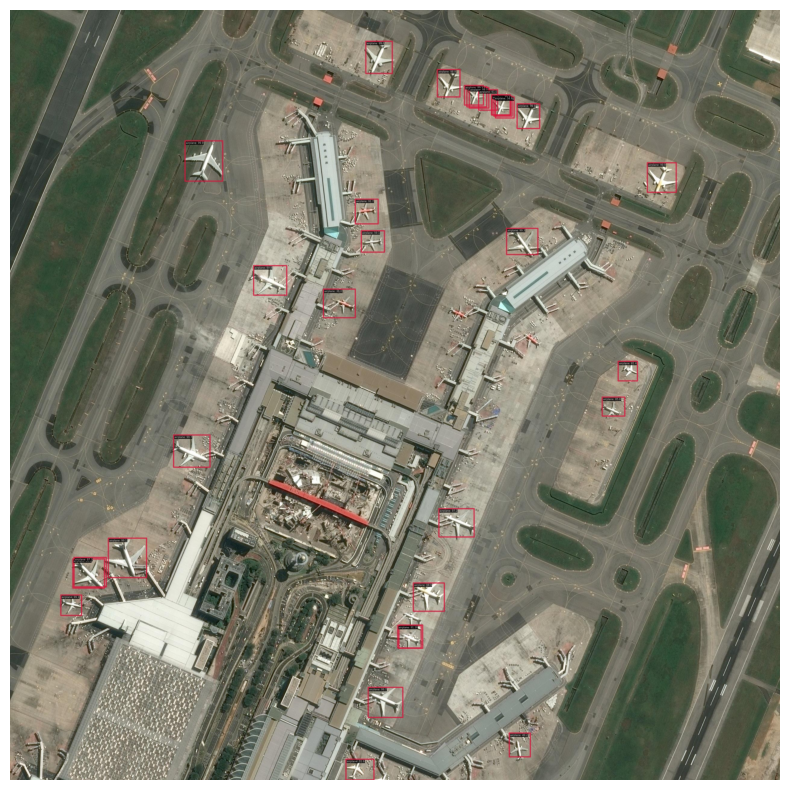

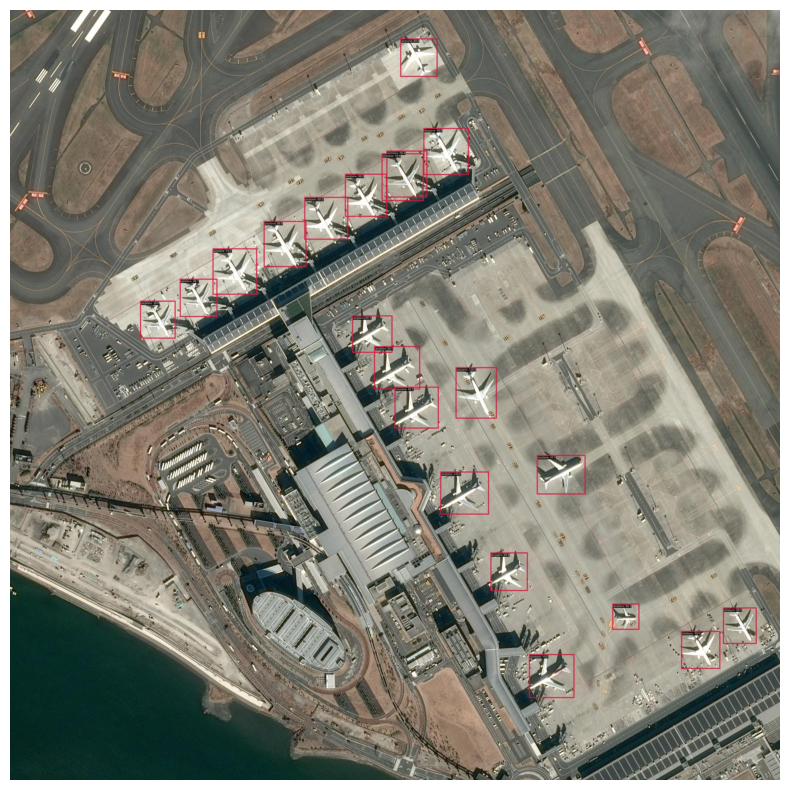

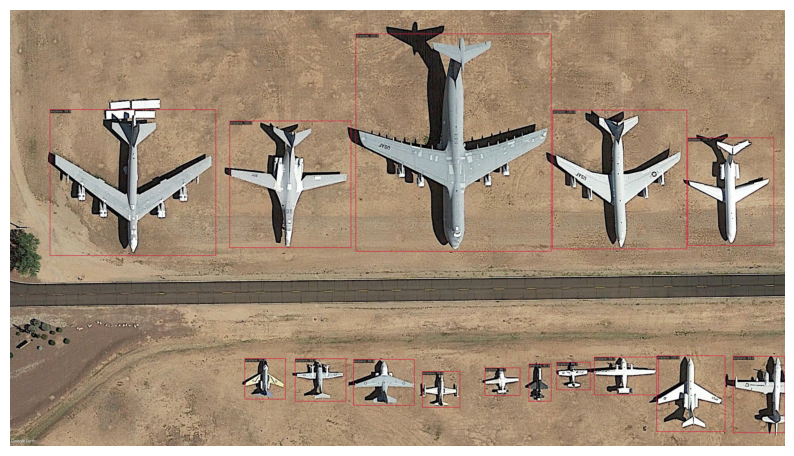

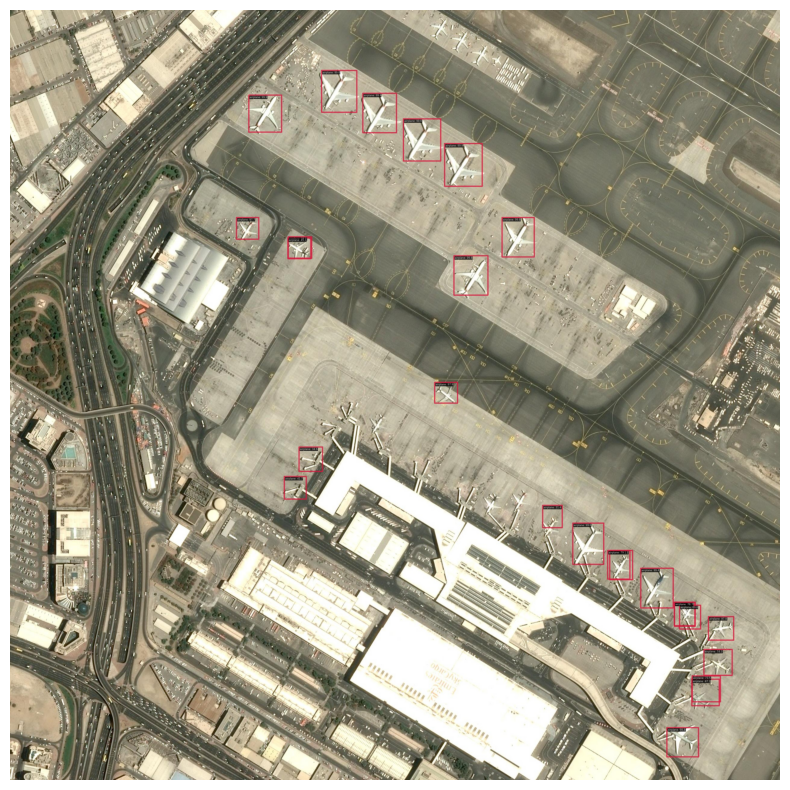

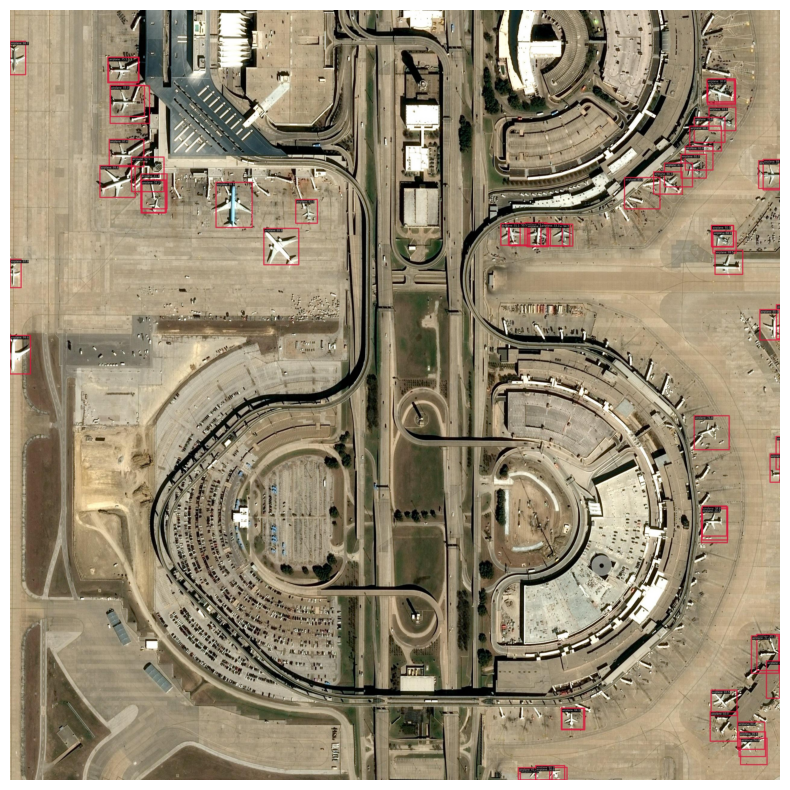

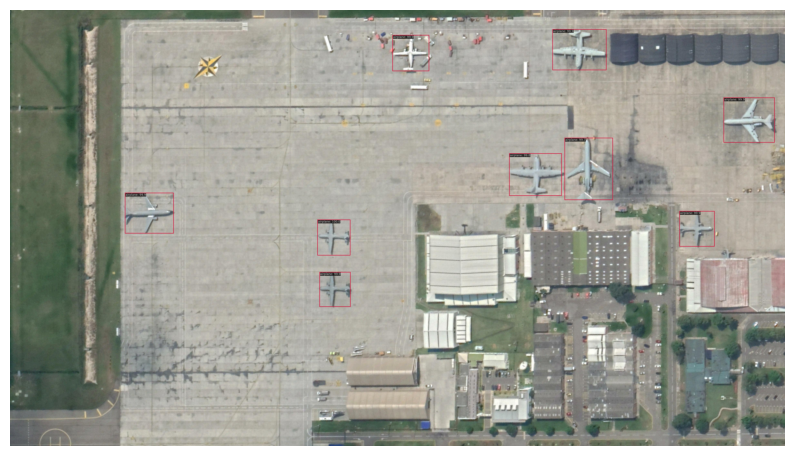

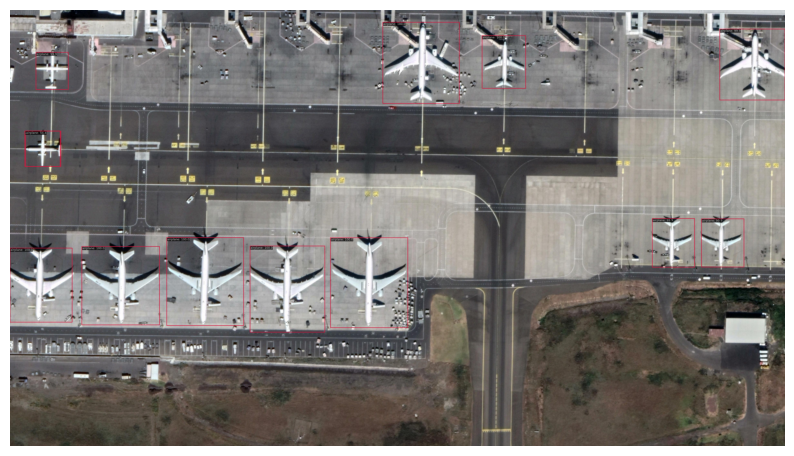

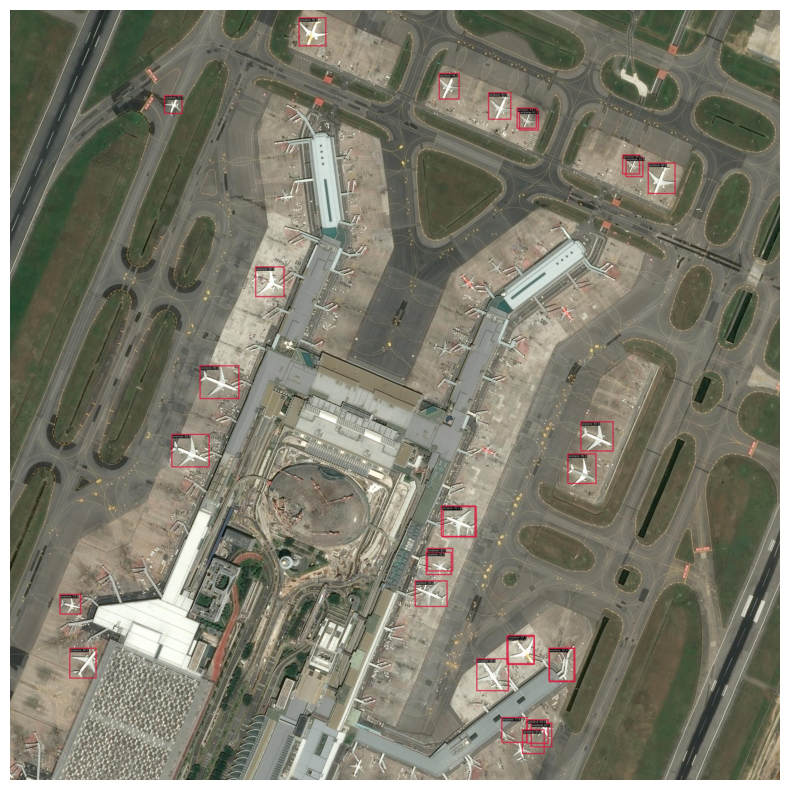

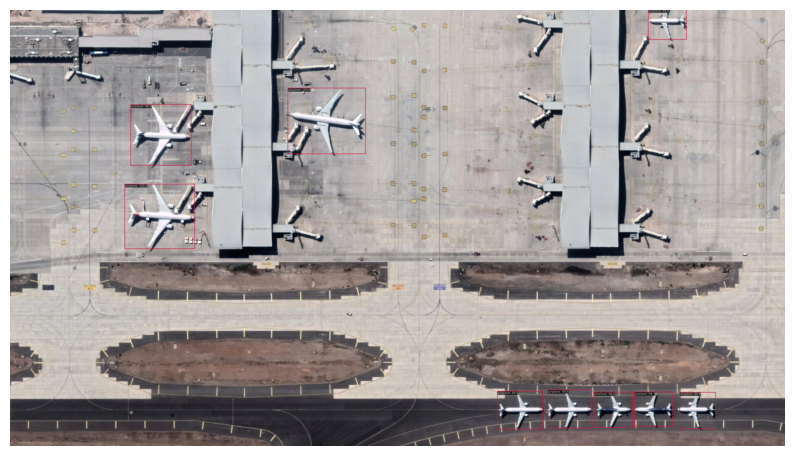

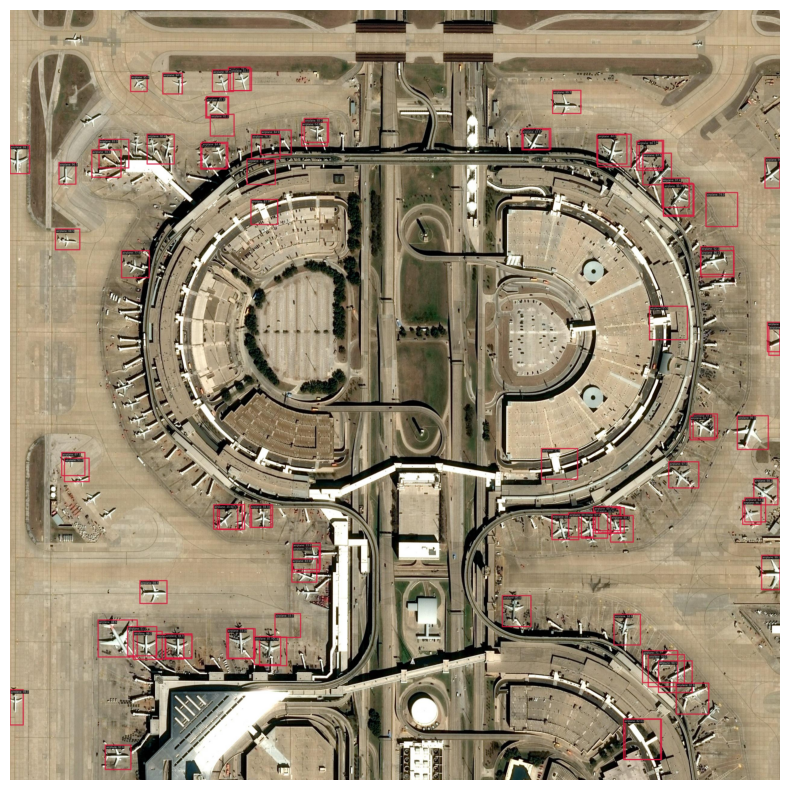

In [4]:
import os
import matplotlib.pyplot as plt
from PIL import Image

# Define the path to the directory containing the jpg images
path_to_images = './inference_test/results/detr_inference/vis'

# Iterate over each file in the directory
for file in os.listdir(path_to_images):
    # Check if the file is a jpg image
    if file.endswith('.jpg'):
        # Open the image using PIL
        img = Image.open(os.path.join(path_to_images, file))

        # Convert the image to an RGB format that matplotlib can understand
        img_rgb = img.convert('RGB')

        # Display the image using matplotlib
        plt.figure(figsize=(10, 10))
        plt.imshow(img_rgb)
        plt.axis('off')
        plt.show()

In [6]:
!python video_inference.py inference_test/videos/Barcelona_airport.mp4 output_tensor/detr/detr_hrplanesv2.py output_tensor/detr/best.pth --out inference_test/videos/Barcelona_airport_DETR_inference.mp4

Loads checkpoint by local backend from path: output_tensor/detr/best.pth
01/11 14:23:53 - mmengine - WARNING - `Visualizer` backend is not initialized because save_dir is None.
[>>                              ] 39/449, 5.3 task/s, elapsed: 7s, ETA:    77s/home/safouane/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:757: UserWarning: Warning: The bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(
/home/safouane/.local/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:828: UserWarning: Warning: The polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(
[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 449/449, 5.8 task/s, elapsed: 77s, ETA:     0s
